In [1]:
import os
from glob import glob
import numpy as np
import dask
import xarray as xr
import cartopy.crs as ccrs
from cmocean import cm
import xgcm

from matplotlib import pyplot as plt
%matplotlib inline
plt.rcParams['figure.figsize'] = 20, 12

from mitequinox.utils import *
from dask import compute, delayed

/home1/datahome/xyu/.miniconda3/envs/equinox/lib/python3.6/site-packages/cmocean/tools.py:76: MatplotlibDeprecationWarning: The is_string_like function was deprecated in version 2.1.
  if not mpl.cbook.is_string_like(rgbin[0]):
/home1/datahome/xyu/.miniconda3/envs/equinox/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: numpy.dtype size changed, may indicate binary incompatibility. Expected 96, got 88
  return f(*args, **kwds)
/home1/datahome/xyu/.miniconda3/envs/equinox/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: numpy.dtype size changed, may indicate binary incompatibility. Expected 96, got 88
  return f(*args, **kwds)


In [2]:
from dask_jobqueue import PBSCluster
local_dir = os.getenv('TMPDIR')
cluster = PBSCluster(local_directory=local_dir)
#print(cluster.job_script())
w = cluster.start_workers(10)

/home1/datahome/xyu/.miniconda3/envs/equinox/lib/python3.6/site-packages/distributed/utils.py:128: RuntimeWarning: Couldn't detect a suitable IP address for reaching '8.8.8.8', defaulting to '127.0.0.1': [Errno 101] Network is unreachable
  % (host, default, e), RuntimeWarning)


In [3]:
# get dask handles and check dask server status
from dask.distributed import Client
client = Client(cluster)

In [4]:
client

Client Scheduler: tcp://10.148.1.29:59088 Dashboard: http://10.148.1.29:8787/status,Cluster Workers: 8 Cores: 32 Memory: 400.00 GB


_________
# 1. Read dataset


In [15]:
Nf = 10

data_dir = '/home1/scratch/xyu/mit_nc_t/'

filenames_SSU = sorted(glob(data_dir+'SSU_*.nc'))
filenames_SSU = filenames_SSU[:Nf]
%time ds_SSU = xr.open_mfdataset(filenames_SSU, concat_dim='time', compat='equals', decode_cf=False)

filenames_SSV = sorted(glob(data_dir+'SSV_*.nc'))
filenames_SSV = filenames_SSV[:Nf]
%time ds_SSV = xr.open_mfdataset(filenames_SSV, concat_dim='time', compat='equals', decode_cf=False)

%time grid = xr.open_dataset('/home1/scratch/xyu/mit_grid.nc', decode_cf=True)

CPU times: user 56 ms, sys: 20 ms, total: 76 ms
Wall time: 78.7 ms
CPU times: user 56 ms, sys: 28 ms, total: 84 ms
Wall time: 87.8 ms
CPU times: user 8 ms, sys: 4 ms, total: 12 ms
Wall time: 14.2 ms


In [16]:
%time ds = xr.merge([ds_SSU, ds_SSV, grid])
print(ds)
print('\n data size: %.1f GB' %(ds.nbytes / 1e9))

CPU times: user 120 ms, sys: 8 ms, total: 128 ms
Wall time: 150 ms
<xarray.Dataset>
Dimensions:  (face: 13, i: 4320, i_g: 4320, j: 4320, j_g: 4320, time: 10)
Coordinates:
  * i_g      (i_g) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 ...
  * j        (j) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 ...
  * face     (face) int64 0 1 2 3 4 5 6 7 8 9 10 11 12
  * time     (time) float64 5.702e+06 5.706e+06 5.71e+06 5.713e+06 5.717e+06 ...
  * i        (i) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 ...
  * j_g      (j_g) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 ...
    XC       (face, j, i) float32 ...
    YC       (face, j, i) float32 ...
    XG       (face, j_g, i_g) float32 ...
    YG       (face, j_g, i_g) float32 ...
    CS       (face, j, i) float32 ...
    SN       (face, j, i) float32 ...
    rA       (face, j, i) float32 ...
    dxG      (face, j_g, i) float32 ...
    dyG      (face, j, i_g) float32 ...
    Depth    (face, j

In [17]:
E_dir = '/home1/scratch/xyu/parameter/'

---


# 2. Parameters

In [18]:
grid = xgcm.Grid(ds, periodic=['X', 'Y'])
grid

<xgcm.Grid>
X Axis (periodic):
  * center   i (4320) --> left
  * left     i_g (4320) --> center
Y Axis (periodic):
  * center   j (4320) --> left
  * left     j_g (4320) --> center

## 2.1 Relative vorticity

In [19]:
for face in range(ds['face'].size):

    zeta = (grid.diff(ds.dyC.isel(face=face) * ds['SSV'].isel(face=face),'X') - grid.diff(ds.dxC.isel(face=face) * ds['SSU'].isel(face=face),'Y'))/ds.rAz.isel(face=face) # relative vorticity  
    zeta = np.real(zeta).rename('zeta') 
    zeta = zeta.chunk({'time': 1,'i_g':4320,'j_g':4320})    
    zeta.to_dataset().to_zarr(E_dir+'zeta_f%02d.nc'% (face), mode='w')
    print('face=%d - allready processed'%(face))

face=0 - allready processed
face=1 - allready processed
face=2 - allready processed
face=3 - allready processed
face=4 - allready processed
face=5 - allready processed
face=6 - allready processed
face=7 - allready processed
face=8 - allready processed
face=9 - allready processed
face=10 - allready processed
face=11 - allready processed
face=12 - allready processed


## 2.2 Rossby number

In [23]:
for face in range(ds['face'].size):
    
    lat = ds['YG']
    omega = 7.3/100000
    f = 2*omega*np.sin(np.deg2rad(lat)).isel(face=face)
    zeta = (grid.diff(ds.dyC.isel(face=face) * ds['SSV'].isel(face=face),'X') - grid.diff(ds.dxC.isel(face=face) * ds['SSU'].isel(face=face),'Y'))/ds.rAz.isel(face=face) # relative vorticity  
    Rossby_number = zeta/f
    Rossby_number = np.real(Rossby_number).rename('Rossby_number') 
    Rossby_number = Rossby_number.chunk({'time': 1,'i_g':4320,'j_g':4320})        
    Rossby_number.to_dataset().to_zarr(E_dir+'Rossby_number_f%02d.nc'% (face), mode='w')
    print('face=%d - allready processed'%(face))

face=0 - allready processed
face=1 - allready processed
face=2 - allready processed
face=3 - allready processed
face=4 - allready processed
face=5 - allready processed
face=6 - allready processed
face=7 - allready processed
face=8 - allready processed
face=9 - allready processed
face=10 - allready processed
face=11 - allready processed
face=12 - allready processed


## 2.3 KE

In [24]:
for face in range(ds['face'].size):

    KE = (grid.interp(ds['SSU'].isel(face=face)**2,'X') + grid.interp(ds['SSV'].isel(face=face)**2,'Y'))/2 # KE
    KE = np.real(KE).rename('KE')    
    KE = KE.chunk({'time': 1,'i':4320,'j':4320})
    KE.to_dataset().to_zarr(E_dir+'KE_f%02d.nc'% (face), mode='w')
    print('face=%d - allready processed'%(face))

face=0 - allready processed
face=1 - allready processed
face=2 - allready processed
face=3 - allready processed
face=4 - allready processed
face=5 - allready processed
face=6 - allready processed
face=7 - allready processed
face=8 - allready processed
face=9 - allready processed
face=10 - allready processed
face=11 - allready processed
face=12 - allready processed


## 2.4 Horizontal divergence

In [10]:
for face in range(ds['face'].size):

    vel_div_components = grid.diff_2d_vector({'X': ds.dyG.isel(face=face) * ds['SSU'].isel(face=face), 'Y': ds.dxG.isel(face=face) * ds['SSV'].isel(face=face)}, boundary='extend')
    vel_div = (vel_div_components['X'] + vel_div_components['Y'])/ds.rA.isel(face=face)
    vel_div = np.real(vel_div).rename('vel_div')    
    vel_div = vel_div.chunk({'time': 1,'i':4320,'j':4320})
    vel_div.to_dataset().to_zarr(E_dir+'vel_div_f%02d.nc'% (face), mode='w')
    print('face=%d - allready processed'%(face))

face=0 - allready processed
face=1 - allready processed
face=2 - allready processed
face=3 - allready processed
face=4 - allready processed
face=5 - allready processed
face=6 - allready processed
face=7 - allready processed
face=8 - allready processed
face=9 - allready processed
face=10 - allready processed
face=11 - allready processed
face=12 - allready processed


# 3. Movies

In [7]:
D = [xr.open_zarr(E_dir+'zeta_f%02d.nc'%(face)) for face in range(13)]
ds_zeta = xr.concat(D, dim='face')

D = [xr.open_zarr(E_dir+'Rossby_number_f%02d.nc'%(face)) for face in range(13)]
ds_rossby = xr.concat(D, dim='face')

D = [xr.open_zarr(E_dir+'KE_f%02d.nc'%(face)) for face in range(13)]
ds_ke = xr.concat(D, dim='face')

D = [xr.open_zarr(E_dir+'vel_div_f%02d.nc'%(face)) for face in range(13)]
ds_div = xr.concat(D, dim='face')

grid = xr.open_dataset('/home1/scratch/xyu/mit_grid.nc')

%time ds = xr.merge([ds_zeta,ds_rossby,ds_ke,ds_div,grid])
print(ds)
print('\n data size: %.1f GB' %(ds.nbytes / 1e9))

CPU times: user 1min 33s, sys: 41.9 s, total: 2min 15s
Wall time: 1min 24s
<xarray.Dataset>
Dimensions:        (face: 13, i: 4320, i_g: 4320, j: 4320, j_g: 4320, time: 720)
Coordinates:
  * face           (face) int64 0 1 2 3 4 5 6 7 8 9 10 11 12
  * i_g            (i_g) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 ...
  * j_g            (j_g) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 ...
  * time           (time) float64 5.702e+06 5.706e+06 5.71e+06 5.713e+06 ...
    XG             (face, j_g, i_g) float32 dask.array<shape=(13, 4320, 4320), chunksize=(1, 4320, 4320)>
    YG             (face, j_g, i_g) float32 dask.array<shape=(13, 4320, 4320), chunksize=(1, 4320, 4320)>
    rAz            (face, j_g, i_g) float32 dask.array<shape=(13, 4320, 4320), chunksize=(1, 4320, 4320)>
  * i              (i) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 ...
  * j              (j) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 ...
    CS             (face, j, i) float32 

In [25]:
def plot_scalar(v, colorbar=False, title=None, vmin=None, vmax=None, savefig=None, 
                offline=False, coast_resolution='110m', figsize=(10,10), cmmap='thermal', **kwargs):
    #
    if vmin is None:
        vmin = v.min()
    if vmax is None:
        vmax = v.max()
    #
    MPL_LOCK = threading.Lock()
    with MPL_LOCK:
        if offline:
            plt.switch_backend('agg')
        #
        fig = plt.figure(figsize=figsize)
        ax = fig.add_subplot(111, projection=ccrs.PlateCarree())
        #ax = fig.add_subplot(111)
        cmap = getattr(cm, cmmap)
        try:           
            im = v.plot.pcolormesh(ax=ax, transform=ccrs.PlateCarree(), vmin=vmin, vmax=vmax,
                                   x='XC', y='YC', add_colorbar=colorbar, cmap=cmap)
            cbar = fig.colorbar(im)
            gl=ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linewidth=2, color='k', 
                            alpha=0.5, linestyle='--')
            gl.xlabels_top = False
            gl.ylabels_right = False
            
            ax.coastlines(resolution=coast_resolution, color='k')
                                   
            # colorbar
            cbar.ax.tick_params(labelsize=16)
            cbar.set_label('$(m^2 s^{-2})$', fontsize=16)
            
            
            # x,y ticks
            ax.set_ylabel('Latitude',fontsize=16)
            ax.set_xlabel('Longitude',fontsize=16)
            ax.tick_params(labelsize=16)                       
                                   
                                   
        except:
            pass
        #
        if title is not None:
            ax.set_title(title)
        #
        if savefig is not None:
            fig.savefig(savefig, dpi=150)
            plt.close(fig)
        #
        if not offline:
            plt.show()

### 5.1. KE

In [26]:
face = 5
vmin, vmax = 0, 0.5

#delete all figures beforehand
figdir = datawork+'/mit/figs/'
print('Figures directory: '+figdir)

lds = ds.isel(face=face)

def process(ds, i, overwrite=True):    
    
    # !! passing the variable ds['Eta'] does not work
    residuals_u = ds['KE'].isel(i=slice(2500,4320), j=slice(0,2000))
    
    time = residuals_u['time'].values/86400.
    figname = figdir+'KE_f%d_t%05d' %(face, i)+'.png'
    #
    if not os.path.isfile(figname) or overwrite:
        #
        title = 'KE (%.2f days)' %time
        plot_scalar(residuals_u, colorbar=False, title=title, savefig=figname, vmin=vmin, vmax=vmax, 
                    offline=True, coast_resolution='50m', figsize=(15,10))
            
            #
        m = float(residuals_u.mean().values)
    else:
        m = -1.
    return m

I = range(len(ds['time']))
#I = range(10)
print(I)
values = [delayed(process)(lds.isel(time=i), i) for i in I]


Figures directory: /home1/datawork/xyu//mit/figs/
range(0, 720)


In [27]:
%time results = compute(*values, get=client.get)

CPU times: user 38.5 s, sys: 13.1 s, total: 51.6 s
Wall time: 2min


# 6. Figures

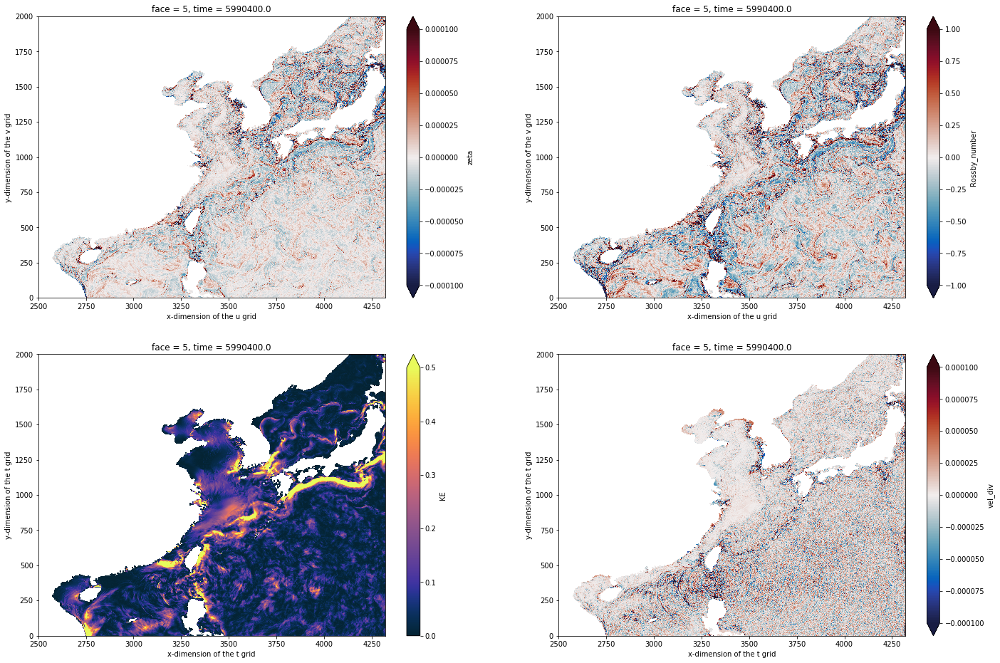

In [39]:
face_plot = 5

fig = plt.figure(figsize = (24,16))

plt.subplot(221)
ds['zeta'].isel(face= face_plot,time=80, i_g=slice(2500,4320), j_g=slice(0,2000)).plot(vmin=-0.0001, vmax=0.0001, cmap = cm.balance)
plt.subplot(222)
ds['Rossby_number'].isel(face= face_plot,time=80, i_g=slice(2500,4320), j_g=slice(0,2000)).plot(vmin=-1., vmax=1., cmap = cm.balance)
plt.subplot(223)
ds['KE'].isel(face= face_plot,time=80, i=slice(2500,4320), j=slice(0,2000)).plot(vmin=0, vmax=0.5, cmap = cm.thermal)
plt.subplot(224)
ds['vel_div'].isel(face= face_plot,time=80, i=slice(2500,4320), j=slice(0,2000)).plot(vmin=-0.0001, vmax=0.0001, cmap = cm.balance)


In [12]:
def quick_llc_plot(data, axis_off=False, **kwargs):
    face_to_axis = {0: (2, 0), 1: (1, 0), 2: (0, 0),
                    3: (2, 1), 4: (1, 1), 5: (0, 1),
                    7: (0, 2), 8: (1, 2), 9: (2, 2),
                    10: (0, 3), 11: (1, 3), 12: (2, 3)}
    transpose = [7, 8, 9, 10, 11, 12]
    gridspec_kw = dict(left=0, bottom=0, right=4, top=4, wspace=0, hspace=0)
    fig, axes = plt.subplots(nrows=3, ncols=4, gridspec_kw=gridspec_kw)
    for face, (j, i) in face_to_axis.items():
        data_ax = data.isel(face=face)
        ax = axes[j,i]
        yincrease = True
        if face in transpose:
            data_ax = data_ax.transpose()
            yincrease = False
        data_ax.plot(ax=ax, yincrease=yincrease, **kwargs)
        if axis_off:
            ax.axis('off')
        ax.set_title('')

In [11]:
D = [xr.open_zarr(E_dir+'vel_div_f%02d.nc'%(face)) for face in range(13)]
ds = xr.concat(D, dim='face')
print(ds)

<xarray.Dataset>
Dimensions:  (face: 13, i: 4320, j: 4320, time: 10)
Coordinates:
  * i        (i) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 ...
  * j        (j) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 ...
  * time     (time) float64 5.702e+06 5.706e+06 5.71e+06 5.713e+06 5.717e+06 ...
    CS       (face, j, i) float32 dask.array<shape=(13, 4320, 4320), chunksize=(1, 4320, 4320)>
    Depth    (face, j, i) float32 dask.array<shape=(13, 4320, 4320), chunksize=(1, 4320, 4320)>
    SN       (face, j, i) float32 dask.array<shape=(13, 4320, 4320), chunksize=(1, 4320, 4320)>
    XC       (face, j, i) float32 dask.array<shape=(13, 4320, 4320), chunksize=(1, 4320, 4320)>
    YC       (face, j, i) float32 dask.array<shape=(13, 4320, 4320), chunksize=(1, 4320, 4320)>
  * face     (face) int64 0 1 2 3 4 5 6 7 8 9 10 11 12
    rA       (face, j, i) float32 dask.array<shape=(13, 4320, 4320), chunksize=(1, 4320, 4320)>
Data variables:
    vel_div  (face, j, i, time

distributed.comm.tcp - WARNING - Closing dangling stream in <TCP local=tcp://10.148.1.29:59467 remote=tcp://10.148.1.29:59088>


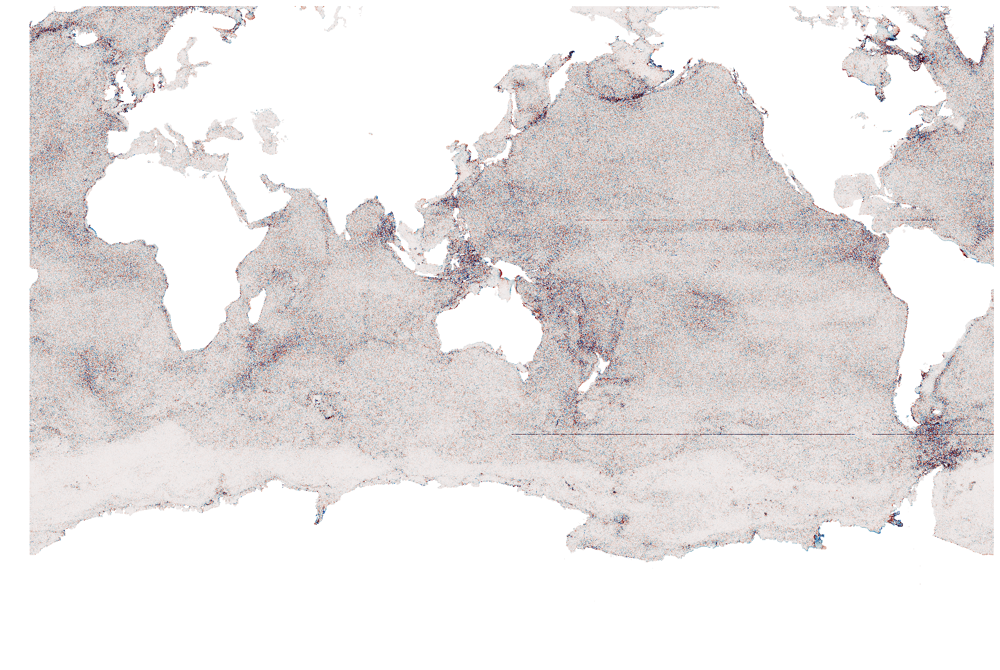

In [13]:
quick_llc_plot(ds['vel_div'].isel(time=5), vmin=-0.0001, vmax=0.0001, add_colorbar=False, axis_off=True, cmap = cm.balance)

In [20]:
D = [xr.open_zarr(E_dir+'zeta_f%02d.nc'%(face)) for face in range(13)]
ds_zeta = xr.concat(D, dim='face')

distributed.comm.tcp - WARNING - Closing dangling stream in <TCP local=tcp://10.148.1.29:59529 remote=tcp://10.148.1.29:59088>


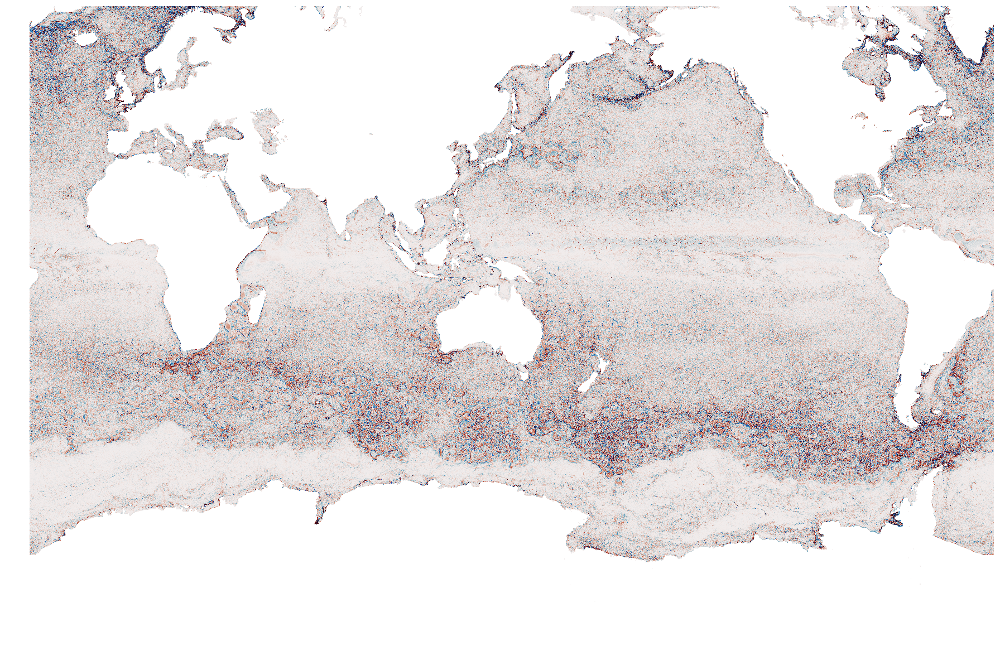

In [23]:
quick_llc_plot(ds_zeta['zeta'].isel(time=5), vmin=-0.0001, vmax=0.0001, add_colorbar=False, axis_off=True, cmap = cm.balance)

In [25]:
cluster.scheduler.close()

<Future finished result=None>